# Processing Data


In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
# ruff: noqa: E402
# find the root of the project
import os
from pathlib import Path
import sys
import polars as pl
import dotenv


ROOT = Path(os.getcwd()).parent
while not ROOT.joinpath(".git").exists():
    ROOT = ROOT.parent

# add the root to the python path
sys.path.append(str(ROOT))


dotenv.load_dotenv(ROOT.joinpath(".env"))

from src.utils import check_gpu_available

GPU = check_gpu_available()
print(f"GPU available: {GPU}")

/home/max/Development/roadside-radar/venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


GPU available: True


## Load the Network


In [3]:
import geopandas as gpd
from src.geometry import RoadNetwork


mainline_net = RoadNetwork(
    lane_gdf=gpd.read_file(ROOT / "data/mainline_lanes.geojson"),
    keep_lanes=["EBL1", "WBL1"],
    step_size=0.01,
)

full_net = RoadNetwork(
    lane_gdf=gpd.read_file(ROOT / "data/mainline_lanes.geojson"),
    keep_lanes=None,
    step_size=0.01,
)

LANE_WIDTH = 3.55
LANE_NUM = 2

## Read in the Trajectories


In [4]:
from datetime import timedelta
import polars as pl
from src.radar import CalibratedRadar
from src.pipelines.open_file import prep_df


USE_FRONT = False


radar_obj = CalibratedRadar(
    radar_location_path=ROOT / "configuration" / "march_calibrated.yaml",
)

In [5]:
radar_df = (
    pl.scan_parquet(
        # Path(os.environ.get("RAW_DATA_DIR")).joinpath("*.parquet")
        Path("/home/max/Development/ua-traffic-data/tmp/all_working.parquet")
    )
    .with_columns(
        pl.col("epoch_time").dt.replace_time_zone("UTC").dt.round("100ms"),
    )
    # .filter(
    #     pl.col("epoch_time").dt.month().is_in([3])
    #     & pl.col("epoch_time").dt.day().is_in([30, 31])
    #     # & pl.col("epoch_time").dt.hour().is_in([9, 10])
    # )
    .pipe(prep_df, f=radar_obj)
    .filter(
        pl.col("epoch_time_cst").is_between(
            pl.lit("2023-03-12 16:40:54").str.strptime(
                pl.Datetime(time_unit="ns", time_zone="US/Central"),
            ),
            pl.lit("2023-03-12 17:46:00").str.strptime(
                pl.Datetime(time_unit="ns", time_zone="US/Central"),
            ),
        )
        # & (pl.col("lane").str.contains("W"))
        # & (pl.col("lane_index") == 0)
    )
    .collect()
    .pipe(
        mainline_net.map_to_lane,
        dist_upper_bound=LANE_WIDTH * LANE_NUM
        - (LANE_WIDTH / 2)
        + 0.5,  # centered on one of the lanes,
        utm_x_col="utm_x",
        utm_y_col="utm_y",
    )
    .rename(
        {
            "name": "lane",
            "angle": "heading_lane",
        }
    )
)

function: create_object_id took: 0.0005068778991699219 seconds
function: filter_short_trajectories took: 0.0006628036499023438 seconds
function: clip_trajectory_end took: 0.0004904270172119141 seconds
function: resample took: 0.00048470497131347656 seconds
function: fix_duplicate_positions took: 0.0003380775451660156 seconds
function: set_timezone took: 0.00012230873107910156 seconds
function: add_cst_timezone took: 6.532669067382812e-05 seconds
function: add_heading took: 7.414817810058594e-05 seconds
function: rotate_radars took: 0.0010340213775634766 seconds
function: update_origin took: 0.0009837150573730469 seconds


In [6]:
radar_df.lazy().group_by("object_id").agg(
    (pl.col("f32_positionX_m").diff() ** 2 + pl.col("f32_positionY_m").diff() ** 2)
    .sqrt()
    .sum()
    .alias("distance")
).select(pl.col("distance").mean()).collect()

distance
f32
152.163101


In [7]:
radar_df.with_columns(pl.count().over(["epoch_time", "object_id"])).filter(
    pl.col("count") > 1
).sort(["epoch_time", "object_id"]).select(["epoch_time", "object_id", "count"])

epoch_time,object_id,count
"datetime[ms, UTC]",u32,u32


In [8]:
from src.pipelines.kalman_filter import (
    prepare_frenet_measurement,
    build_extension,
    add_timedelta,
    build_kalman_id,
    filter_short_trajectories,
)


prediction_length = 3.5

print(radar_df.shape)

radar_df = (
    radar_df.pipe(add_timedelta, vehicle_id_col=["object_id", "lane"])
    .pipe(build_kalman_id, split_time_delta=prediction_length + 0.1)
    .pipe(filter_short_trajectories, minimum_distance_m=5, minimum_duration_s=2)
    .pipe(prepare_frenet_measurement)
    .pipe(build_extension, seconds=prediction_length)
    .pipe(add_timedelta)
    .collect()
)

print(radar_df.shape)

(1961255, 38)
function: add_timedelta took: 0.00017309188842773438 seconds
function: build_kalman_id took: 0.00025463104248046875 seconds
function: filter_short_trajectories took: 0.0001838207244873047 seconds
function: prepare_frenet_measurement took: 0.00032591819763183594 seconds
function: build_extension took: 2.0276594161987305 seconds
function: add_timedelta took: 0.0001163482666015625 seconds
(1588365, 52)


<Axes: xlabel='dist', ylabel='f32_length_m'>

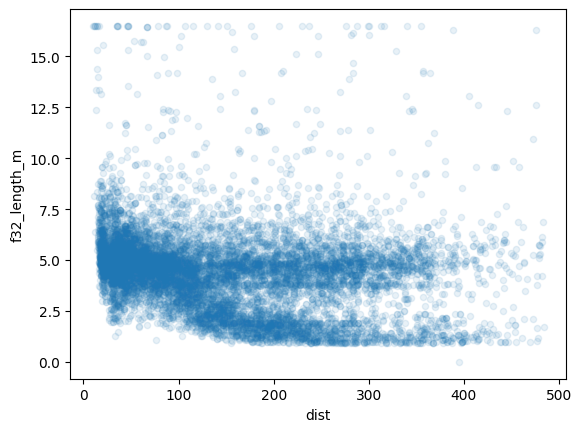

In [9]:
radar_df[["dist", "f32_length_m"]].sample(10_000).to_pandas().plot.scatter(
    x="dist", y="f32_length_m", alpha=0.1
)

<Axes: ylabel='Frequency'>

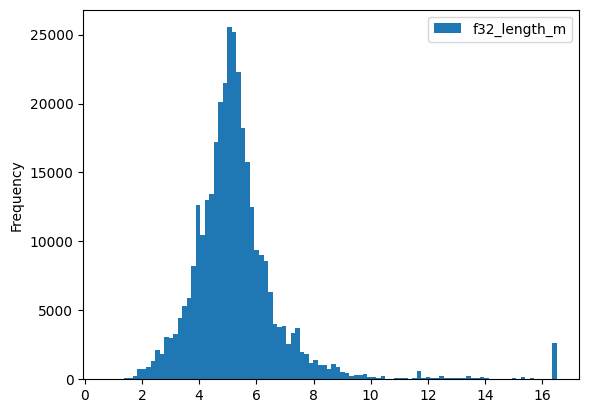

In [10]:
radar_df.filter(pl.col("dist").is_between(10, 50))[
    ["f32_length_m"]
].to_pandas().plot.hist(bins=100)

In [11]:
from src.pipelines.kalman_filter import build_kalman_df

filter_df = (
    radar_df
    # .with_columns((pl.col("distanceToFront_s") + pl.col("s")).alias("front_s"))
    .pipe(build_kalman_df, s_col="front_s" if USE_FRONT else "s")
    .filter(
        pl.col("max_time") < pl.col("max_time").max()  # filter out the outlier times
    )
    .collect()
)

function: build_kalman_df took: 0.0006396770477294922 seconds


### IMM Filter the Radar Trajectories


In [12]:
filter_df.group_by("vehicle_ind").agg(pl.col("time_ind").max())["time_ind"].describe(
    percentiles=[0.5, 0.75, 0.9, 0.95, 0.9999]
)

statistic,value
str,f64
"""count""",10047.0
"""null_count""",0.0
"""mean""",156.924256
"""std""",84.104823
"""min""",33.0
"""50%""",142.0
"""75%""",182.0
"""90%""",234.0
"""95%""",282.0


In [13]:
from src.filters.vectorized_kalman import batch_imm_df
import numpy as np

filt_df = batch_imm_df(
    filter_df.rename({"measurement": "z"}),
    filters=("CALC", "CALK", "CVLK"),
    M=np.array([[0.8, 0.1, 0.1], [0.1, 0.8, 0.1], [0.1, 0.1, 0.8]]),
    mu=np.array([0.2, 0.2, 0.6]),
    # chunk_size=3_500,
    chunk_size=800 if not GPU else 9_000 * 1000,
    gpu=GPU,
)

  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:20<00:00, 20.81s/it]


In [14]:
filt_df.shape[0]

1586665

In [15]:
from src.pipelines.kalman_filter import join_results

joined_df = join_results(filt_df, filter_df, radar_df)

if USE_FRONT:
    joined_df = joined_df.rename({"s": "front_s"})

joined_df = joined_df.collect(streaming=True)

function: join_results took: 0.0008661746978759766 seconds


In [16]:
print(
    "{:3d},{:3d},{:3d}".format(
        joined_df.shape[0], filter_df.shape[0], radar_df.shape[0]
    )
)

1586665,1586665,1588365


In [17]:
radar_df.with_columns(pl.count().over(["epoch_time", "object_id"])).filter(
    pl.col("count") > 1
).sort(["epoch_time", "object_id"]).select(["epoch_time", "object_id", "count"])

epoch_time,object_id,count
"datetime[ms, UTC]",u32,u32


In [18]:
joined_df.with_columns(pl.count().over(["epoch_time", "object_id"])).filter(
    pl.col("count") > 1
).sort(["epoch_time", "object_id"]).select(["epoch_time", "object_id", "count"])

epoch_time,object_id,count
"datetime[ms, UTC]",u32,u32


In [19]:
if "joined_df" not in locals():
    joined_df = pl.read_parquet(
        Path(os.environ.get("RAW_DATA_DIR"))
        / "march_kalman_filter_results"
        / "*/*.parquet",
        use_pyarrow=True,
        memory_map=True,
    )

In [20]:
joined_df = joined_df.lazy().sort("epoch_time").collect(streaming=True).rechunk()

## Plotting the Lanes


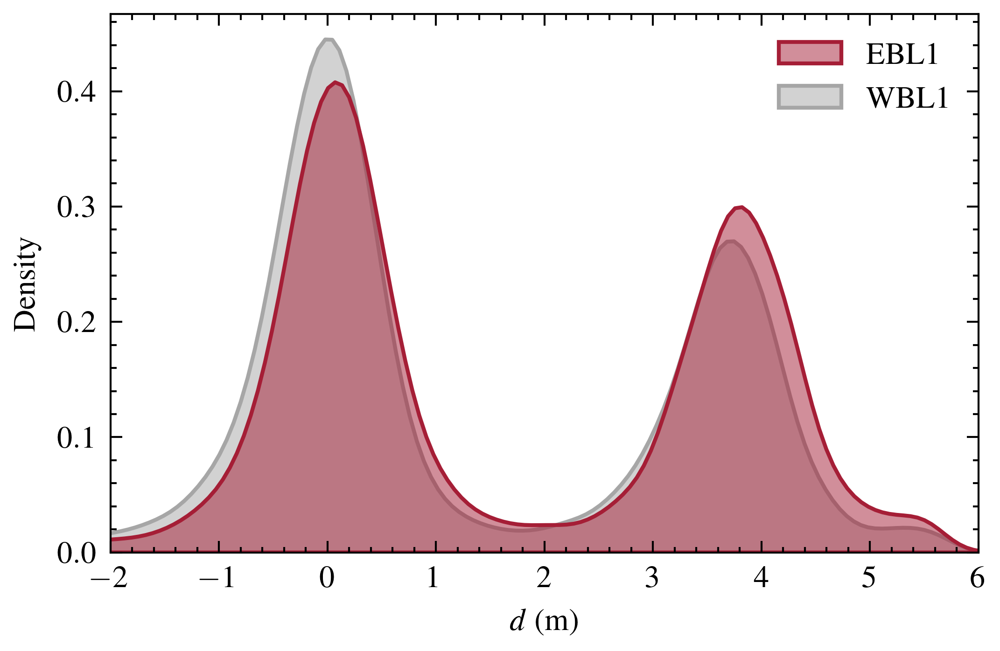

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns
import scienceplots

engine_color = [0.65, 0.65, 0.65]
gps_color = [0, 0, 0.75]
plutron_color = [0, 0, 0]
alabama = [165, 30, 54]
alabama = [i / 255 for i in alabama]

plt.style.use(["science", "ieee"])

fig, ax = plt.subplots(
    figsize=(4, 2.5),
)

# joined_df.filter(pl.col("lane").str.contains("E") & pl.col("d").is_between(-6, 6))[
#     ["d"]
# ].sample(100_000).to_pandas().plot.hist(bins=100, ax=ax, alpha=0.5, )

# create a kde plot of the d dimension in both directions
lane_df = (
    joined_df.select(
        [
            "lane",
            "d",
        ]
    )
    .melt(id_vars="lane", value_name="d")
    .filter(pl.col("d").is_between(-6, 6))
    .sample(1_000_000)
)


lane_df = lane_df.to_pandas()

sns.kdeplot(
    data=lane_df,
    x="d",
    hue="lane",
    fill=True,
    common_norm=False,
    alpha=0.5,
    ax=ax,
    linewidth=1,
    palette=[alabama, engine_color],
)

ax.set_xlim(-2, 6)

ax.set_xlabel("$d$ (m)")
# remove the title of the legend
ax.get_legend().set_title("")

# st th

### Classify the Lanes


In [22]:
from src.pipelines.lane_classification import label_lane, label_lanes_tree
from src.gmm.lane_classification import build_lane_model
from src.plotting.lane_gmm import plot_model

In [23]:
joined_df = joined_df.pipe(
    label_lanes_tree,
    full_network=full_net,
    kalman_network=mainline_net,
    lane_width=LANE_WIDTH,
    s_col="front_s" if USE_FRONT else "s",
)


print(joined_df.filter(pl.col("lane_index").is_null()).shape[0] / joined_df.shape[0])

joined_df = joined_df.with_columns(pl.col("lane_index").fill_null(2))

0.058679053234299616


/tmp/ipykernel_352275/3649221666.py:22: UserWarning: 
The palette list has fewer values (4) than needed (6) and will cycle, which may produce an uninterpretable plot.
  sns.kdeplot(


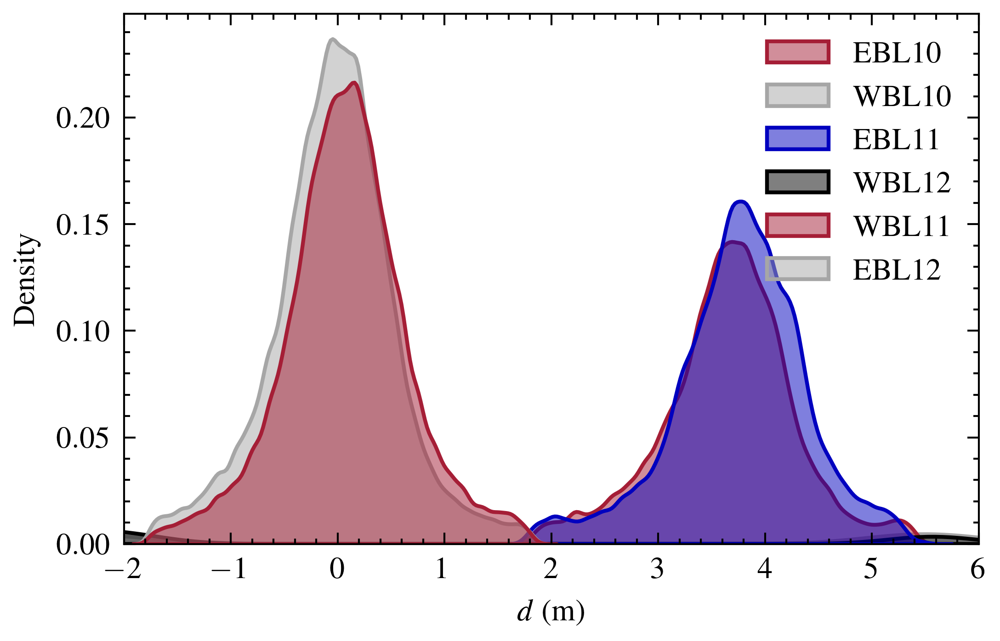

In [24]:
fig, ax = plt.subplots(
    figsize=(4, 2.5),
)

lane_df = (
    joined_df.select(
        [
            pl.concat_str([pl.col("lane"), pl.col("lane_index").cast(str)]).alias(
                "lane"
            ),
            "d",
        ]
    )
    .melt(id_vars="lane", value_name="d")
    .filter(pl.col("d").is_between(-6, 6))
    .sample(1_000_000)
)


lane_df = lane_df.to_pandas()

sns.kdeplot(
    data=lane_df,
    x="d",
    hue="lane",
    fill=True,
    common_norm=True,
    alpha=0.5,
    ax=ax,
    linewidth=1,
    palette=[alabama, engine_color, gps_color, plutron_color],
)

ax.set_xlim(-2, 6)

ax.set_xlabel("$d$ (m)")
# remove the title of the legend
ax.get_legend().set_title("")

# st th

## Save the Kalman Filtered Trajectories

## Merge the Trajectories


#### Things to try:
1. Ignore sublanes
2. Can you do x/y instead of s/d?
3. 

In [25]:
from src.pipelines.association import (
    build_leader_follower_df,
    add_front_back_s,
    build_leader_follower_entire_history_df,
)

joined_df = (
    joined_df.lazy()
    .pipe(
        add_front_back_s,
        use_global_median=True,
    )
    .sort(by=["epoch_time"])
    .set_sorted(["epoch_time"])
    .collect(streaming=True)
)

function: add_front_back_s took: 0.004686832427978516 seconds


In [26]:
lf_df = (
    joined_df.lazy()
    # .lazy()
    # .pipe(
    #     build_leader_follower_entire_history_df,
    #     s_col="front_s" if USE_FRONT else "s",
    #     use_lane_index=True,
    #     max_s_gap=20,
    # )
    .pipe(
        build_leader_follower_entire_history_df,
        s_col="front_s" if USE_FRONT else "s",
        use_lane_index=True,
        max_s_gap=0.5 * 25,  # max headway of 0.5 seconds at 25 m/s
    )
    .filter(~(pl.col("prediction") & pl.col("prediction_leader")))
    # .filter()
    # assumption that radar tracks perfectly
    # .filter((pl.col("ip") != pl.col("ip_leader")) | (pl.col("s_velocity") > 3))
    # .filter(pl.col("s_velocity") > 5)
    .filter(pl.col("lane_index") <= 1)
    .collect(streaming=True)
)

function: lazy_func took: 0.000789642333984375 seconds


### Calculate the Association Log-Likelihood Distance


In [27]:
from src.pipelines.association import calc_assoc_liklihood_distance

dims = 4

lf_df = lf_df.pipe(calc_assoc_liklihood_distance, gpu=GPU, dims=dims, permute=True)

function: lazy_func took: 2.868821859359741 seconds


### Calculate the Match Indexes


In [28]:
from scipy.stats import chi2
from src.pipelines.association import (
    calculate_match_indexes,
    pipe_gate_headway_calc,
    build_match_df,
    filter_bad_lane_matches,
)

# prediction_length = 4

assoc1_df = (
    lf_df
    # is this really necessary? Just filters the match for a certain tome
    .pipe(calculate_match_indexes, match_time_threshold=100, min_time_threshold=1)
    .pipe(
        pipe_gate_headway_calc,
        alpha=0.1,
        window=20,
        association_dist_cutoff=chi2.ppf(0.9875, dims),
    )
    .collect(streaming=True)
)

function: lazy_func took: 0.0005447864532470703 seconds
function: lazy_func took: 0.0002319812774658203 seconds


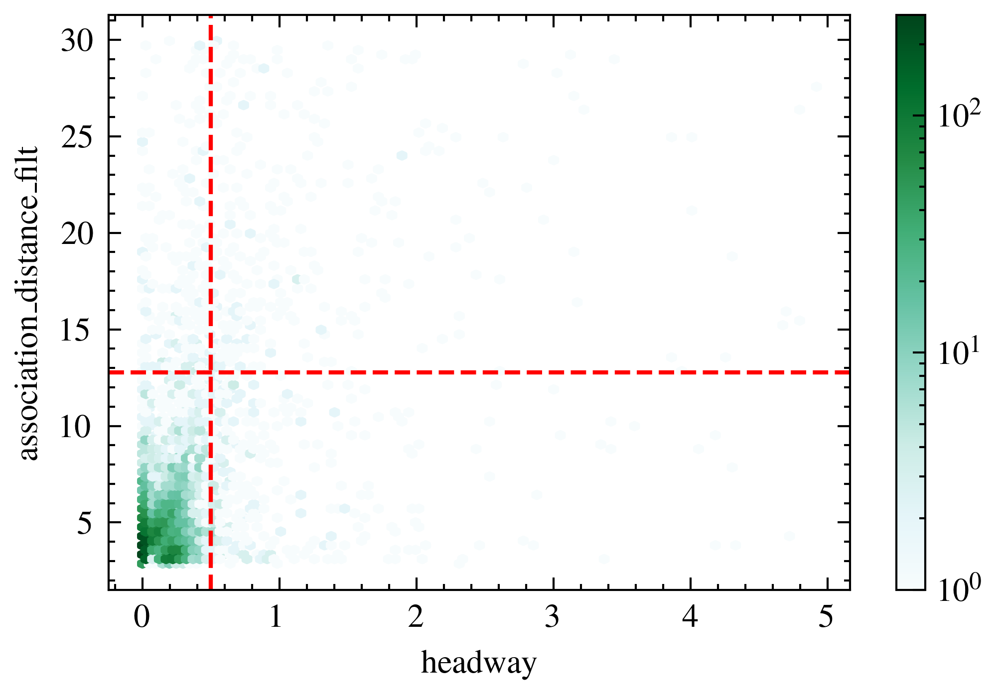

In [29]:
# # scatter plot the association distance vs the headway
# fig, ax = plt.subplots(figsize=(4, 2.5))

# assoc1_df.filter(pl.col("headway").is_between(-10, 20))[
#     ["headway", "association_distance_filt"]
# ].sample(10_000).to_pandas().plot.contour(x="headway", y="association_distance_filt", alpha=0.01, ax=ax)


# make a contour plot of the association distance vs the headway
import matplotlib


fig, ax = plt.subplots(figsize=(4, 2.5))

assoc1_df.filter(
    pl.col("headway").is_between(0, 5)
    & pl.col("association_distance_filt").is_between(-5, 30)
)[["headway", "association_distance_filt"]].to_pandas().plot.hexbin(
    x="headway",
    y="association_distance_filt",
    ax=ax,
    gridsize=100,
    norm=matplotlib.colors.LogNorm(),
)


# add a horizontal line at the 95th percentile of the chi squared distribution
ax.axhline(chi2.ppf(0.9875, dims), color="r", linestyle="--")

# # set the y axis range
# ax.set_ylim(-5, 10)

# add a vertical line at headway cutoff of 0.5
ax.axvline(0.5, color="r", linestyle="--")

In [30]:
match_df = (
    assoc1_df.lazy()
    .pipe(
        build_match_df,
        traj_time_df=joined_df.group_by("object_id")
        .agg(
            pl.col("epoch_time").max().alias("epoch_time_max"),
        )
        .lazy(),
        assoc_cutoff=chi2.ppf(0.95, dims),
        assoc_cutoff_pred=chi2.ppf(0.95, dims),
        time_headway_cutoff=0.01,
    )
    .collect(streaming=True)
)


# 1 - 0.99

function: lazy_func took: 0.027602195739746094 seconds


In [31]:
# # this is stupid
# # if "assoc_df" in globals():
# objs = assoc_df.filter(pl.col("vehicle_id").is_in([47382,]))[
#     "object_id"
# ]  # noqa: F821

# lf_df.filter(pl.col("object_id").is_in(objs) | pl.col("leader").is_in(objs)).filter(
#     pl.col("epoch_time").dt.second() == 11
# ).with_columns(
#             [
#                 # ----------- Calculate the Time Headway ------------
#                 ((pl.col("s_leader") - pl.col("s")) / pl.col("s_velocity")).alias(
#                     "headway"
#                 ),
#                 # -------- Calculate the Match Indexes Take 2 ------------
#                 # Find periods where there is no prediction
#                 # prediction naturally has more uncertainty
#                 # ---------------------------
#                 # find the start index to take
#                 # pl.col("object_id").cumcount().over("pair").alias("sort_index"),
#                 # find the end index to use
#             ]
#         )

### Re-Label the Joined Trajectories


In [32]:
from src.pipelines.association import create_vehicle_ids
import networkx as nx
from itertools import combinations
from networkx.algorithms.connectivity import (
    node_connectivity,
    all_pairs_node_connectivity,
)

cc, G, assoc_df = joined_df.pipe(
    create_vehicle_ids,
    match_df,
)


def get_ordered_combinations(cc_list):
    return [
        (start, end, veh_i) if start < end else (end, start, veh_i)
        for veh_i, cc_list in enumerate(cc)
        for start, end in combinations(cc_list, 2)
    ]

function: lazy_func took: 0.063507080078125 seconds


In [33]:
begin_end_df = joined_df.group_by("object_id").agg(
    pl.col("epoch_time").min().alias("begin_time"),
    pl.col("epoch_time").max().alias("end_time"),
)

combs = get_ordered_combinations(cc)

permute_df = (
    pl.DataFrame(
        combs,
        schema=["start", "end", "vehicle_index"],
    )
    .join(
        begin_end_df.rename({"object_id": "start"}).with_columns(
            pl.col("start").cast(int)
        ),
        on="start",
    )
    .join(
        begin_end_df.rename({"object_id": "end"}).with_columns(pl.col("end").cast(int)),
        on="end",
    )
    .with_columns(
        pl.col(["start", "end"]).cast(pl.UInt32),
    )
    # filter for overlap in time
    .filter(
        pl.min_horizontal(pl.col("end_time"), pl.col("end_time_right"))
        > pl.max_horizontal(pl.col("begin_time"), pl.col("begin_time_right"))
    )
    .with_columns(
        # sort the object id and leader
        pl.when(pl.col("start") < pl.col("end"))
        .then(pl.concat_list([pl.col("start"), pl.col("end")]))
        .otherwise(pl.concat_list([pl.col("end"), pl.col("start")]))
        .alias("pair")
    )
    .join(
        assoc1_df.select("pair", "association_distance_filt", "join_time"),
        left_on=[pl.col("pair").hash()],
        right_on=[pl.col("pair").hash()],
        how="left",
    )
)

In [34]:
need2compute = permute_df.filter(pl.col("association_distance_filt").is_null()).select(
    "start", "end", "pair"
)

cols = [
    "object_id",
    "epoch_time",
    "s",
    "lane",
    "d",
    "s_velocity",
    "d_velocity",
    "front_s",
    "back_s",
    "P",
]

need2compute = (
    need2compute.lazy()
    .join(
        joined_df.lazy()
        .filter(~pl.col("prediction") & (pl.col("lane_index") < 2))
        .select(cols)
        .rename({"object_id": "start"}),
        on="start",
    )
    .join(
        joined_df.lazy()
        .filter(~pl.col("prediction") & (pl.col("lane_index") < 2))
        .select(cols)
        .rename({"object_id": "end"}),
        on=["end", "epoch_time"],
        suffix="_leader",
    )
    .collect()
    .pipe(calc_assoc_liklihood_distance, gpu=GPU, dims=dims, permute=True)
    .with_columns(
        pl.col("association_distance").rolling_mean(window_size=20, min_periods=1)
    )
    .group_by("pair")
    .agg(
        pl.col("association_distance").min().alias("association_distance_filt"),
        pl.col("epoch_time")
        .filter(pl.col("association_distance") < chi2.ppf(0.95, dims))
        .first()
        .alias("join_time"),
    )
)


permute_df = permute_df.update(need2compute, on="pair", how="left")

function: lazy_func took: 0.2749154567718506 seconds


[6.218339920043945]


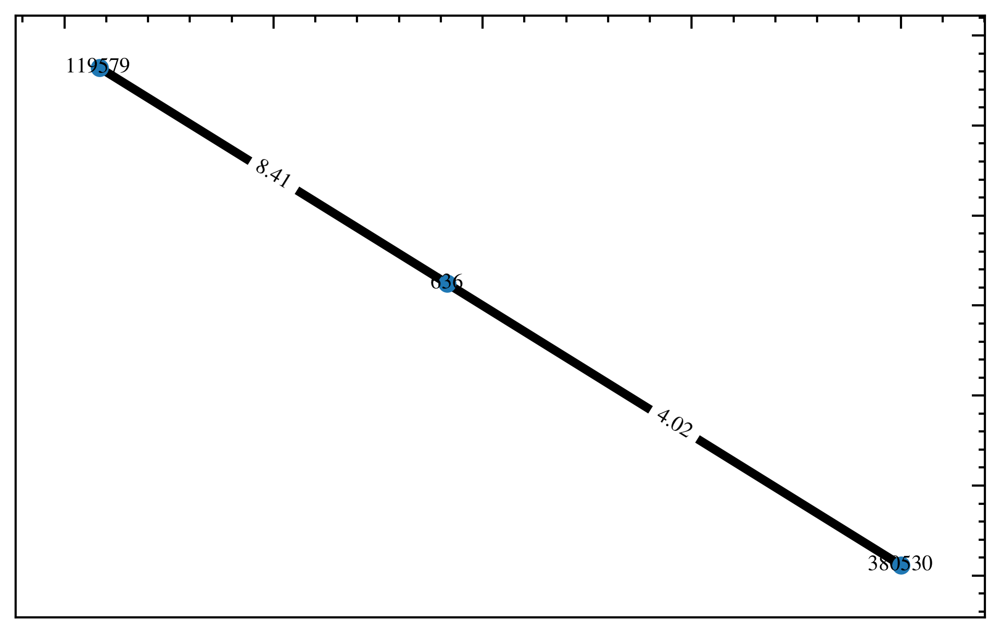

In [79]:
from typing import List


def get_graph_score(subgraphs: List[List[int]]) -> float:
    scores = []
    for subgraph in subgraphs:
        combs = [
            (start, end) if start < end else (end, start)
            for start, end in combinations(subgraph, 2)
        ]
        score = permute_df.join(
            pl.DataFrame(
                combs,
                schema=["start", "end"],
            ).with_columns(
                pl.col(["start", "end"]).cast(pl.UInt32),
            ),
            on=["start", "end"],
            how="inner",
        )["association_distance_filt"].mean()

        scores.append(score)

    return scores


def get_graph_score_sub(sub_graph: nx.Graph, remove_connections: List[tuple]) -> float:
    for remove in remove_connections:
        sub_graph.remove_edge(*remove)

    return get_graph_score(list(nx.connected_components(sub_graph)))


def plot_graph(veh_id: int, sublist: list = None, subgraph: nx.Graph = None) -> None:
    if subgraph is None:
        cc_list = sublist or cc[veh_id]

        small_g = G.subgraph(cc_list)
    else:
        small_g = subgraph

    # plot the small graph
    fig, ax = plt.subplots(figsize=(4, 2.5))

    # replace negative weights w/ abs value
    for u, v, d in small_g.edges(data=True):
        if d["weight"] < 0:
            d["weight"] = abs(d["weight"])

            # update the edge weight

    pos = nx.spring_layout(
        small_g,
    )  # positions for all nodes - seed for reproducibility

    # nodes
    nx.draw_networkx_nodes(small_g, pos, node_size=10)

    # edges
    nx.draw_networkx_edges(small_g, pos, width=2)
    # nx.draw_networkx_edges(
    #     small_g, pos, edgelist=esmall, width=6, alpha=0.5, edge_color="b", style="dashed"
    # )

    # node labels
    nx.draw_networkx_labels(small_g, pos, font_size=5, font_family="sans-serif")
    # edge weight labels
    edge_labels = nx.get_edge_attributes(small_g, "weight")
    # round the edge weights
    edge_labels = {k: round(v, 2) for k, v in edge_labels.items()}
    nx.draw_networkx_edge_labels(small_g, pos, edge_labels, font_size=5)


veh = 1
print(get_graph_score([cc[veh]]))
plot_graph(veh, cc[veh])

In [89]:
vehicle_id = 407

degree_df = (
    pl.DataFrame(
        list(G.degree()),
        schema=["object_id", "degree"],
    )
    .with_columns(pl.col("object_id").cast(pl.UInt32))
    .join(
        assoc_df.group_by("object_id").agg(pl.col("vehicle_id").first()),
        on="object_id",
    )
    .join(
        match_df.select(
            [
                pl.col("object_id"),
                pl.col("association_distance_filt"),
                pl.col("join_time"),
                pl.col("leader").alias("other_id"),
            ]
        ).vstack(
            match_df.select(
                [
                    pl.col("leader").alias("object_id"),
                    pl.col("association_distance_filt"),
                    pl.col("join_time"),
                    pl.col("object_id").alias("other_id"),
                ]
            )
        ),
        on="object_id",
        # how="left",
    )
    .with_columns(
        pl.when(pl.col("object_id") < pl.col("other_id"))
        .then(pl.concat_list([pl.col("object_id"), pl.col("other_id")]))
        .otherwise(pl.concat_list([pl.col("other_id"), pl.col("object_id")]))
        .alias("pair")
    )
    .with_columns(pl.col("pair").hash().alias("pair_hash"))
    .filter((pl.col("pair_hash").cum_count() == 0).over("pair_hash"))
)

# degree_df = degree_df.filter(pl.col("degree") >= 3)

degree_df = degree_df.filter(pl.col("vehicle_id") == vehicle_id).sort(
    ["vehicle_id", "join_time"]
)

slice_1 = degree_df.with_columns(
    (pl.col("degree").cum_count() + 1).over("object_id").alias("cum_degree")
)

slice_1.head(10)

# degree_df

object_id,degree,vehicle_id,association_distance_filt,join_time,other_id,pair,pair_hash,cum_degree
u32,i64,u64,f32,"datetime[ms, UTC]",u32,list[u32],u64,u32
65575,2,407,6.724234,2023-03-12 21:46:16.200 UTC,278340,"[65575, 278340]",1639653338958604920,1
5364,2,407,9.260791,2023-03-12 21:46:16.200 UTC,278340,"[5364, 278340]",834114840374116406,1
15110,2,407,8.863899,2023-03-12 21:46:36.800 UTC,65575,"[15110, 65575]",2776264413371690009,1
228298,3,407,5.11565,2023-03-12 21:46:39.200 UTC,278340,"[228298, 278340]",12116099582625351419,1
5364,2,407,8.580896,2023-03-12 21:46:39.200 UTC,228298,"[5364, 228298]",15248216016979758514,2
15110,2,407,3.821563,2023-03-12 21:46:41.400 UTC,129070,"[15110, 129070]",13549554756773786659,2
103150,1,407,4.765441,2023-03-12 21:46:50.600 UTC,228298,"[103150, 228298]",6363438952984495484,1
120618,1,407,4.559287,2023-03-12 21:46:51.300 UTC,129070,"[120618, 129070]",14693009824973154812,1


In [91]:
permute_df.filter(
    pl.col('vehicle_index') == 407
)

start,end,vehicle_index,begin_time,end_time,begin_time_right,end_time_right,pair,association_distance_filt,join_time
u32,u32,i64,"datetime[ms, UTC]","datetime[ms, UTC]","datetime[ms, UTC]","datetime[ms, UTC]",u64,f32,"datetime[ms, UTC]"
15110,278340,407,2023-03-12 21:46:36.800 UTC,2023-03-12 21:46:44.800 UTC,2023-03-12 21:46:16.200 UTC,2023-03-12 21:46:43.400 UTC,13187056958116391262,30.330151,null
65575,278340,407,2023-03-12 21:45:56.400 UTC,2023-03-12 21:46:37.600 UTC,2023-03-12 21:46:16.200 UTC,2023-03-12 21:46:43.400 UTC,1639653338958604920,6.724234,2023-03-12 21:46:16.200 UTC
228298,278340,407,2023-03-12 21:46:39.200 UTC,2023-03-12 21:47:01.200 UTC,2023-03-12 21:46:16.200 UTC,2023-03-12 21:46:43.400 UTC,12116099582625351419,5.11565,2023-03-12 21:46:39.200 UTC
129070,278340,407,2023-03-12 21:46:41.400 UTC,2023-03-12 21:47:02.300 UTC,2023-03-12 21:46:16.200 UTC,2023-03-12 21:46:43.400 UTC,14650823293427258306,23.275229,null
5364,278340,407,2023-03-12 21:45:41.100 UTC,2023-03-12 21:46:39.400 UTC,2023-03-12 21:46:16.200 UTC,2023-03-12 21:46:43.400 UTC,834114840374116406,9.260791,2023-03-12 21:46:16.200 UTC
15110,65575,407,2023-03-12 21:46:36.800 UTC,2023-03-12 21:46:44.800 UTC,2023-03-12 21:45:56.400 UTC,2023-03-12 21:46:37.600 UTC,2776264413371690009,8.863899,2023-03-12 21:46:36.800 UTC
15110,228298,407,2023-03-12 21:46:36.800 UTC,2023-03-12 21:46:44.800 UTC,2023-03-12 21:46:39.200 UTC,2023-03-12 21:47:01.200 UTC,2235731562734834906,14230.166016,null
15110,129070,407,2023-03-12 21:46:36.800 UTC,2023-03-12 21:46:44.800 UTC,2023-03-12 21:46:41.400 UTC,2023-03-12 21:47:02.300 UTC,13549554756773786659,3.821563,2023-03-12 21:46:41.400 UTC
5364,15110,407,2023-03-12 21:45:41.100 UTC,2023-03-12 21:46:39.400 UTC,2023-03-12 21:46:36.800 UTC,2023-03-12 21:46:44.800 UTC,3124134148878158295,null,null


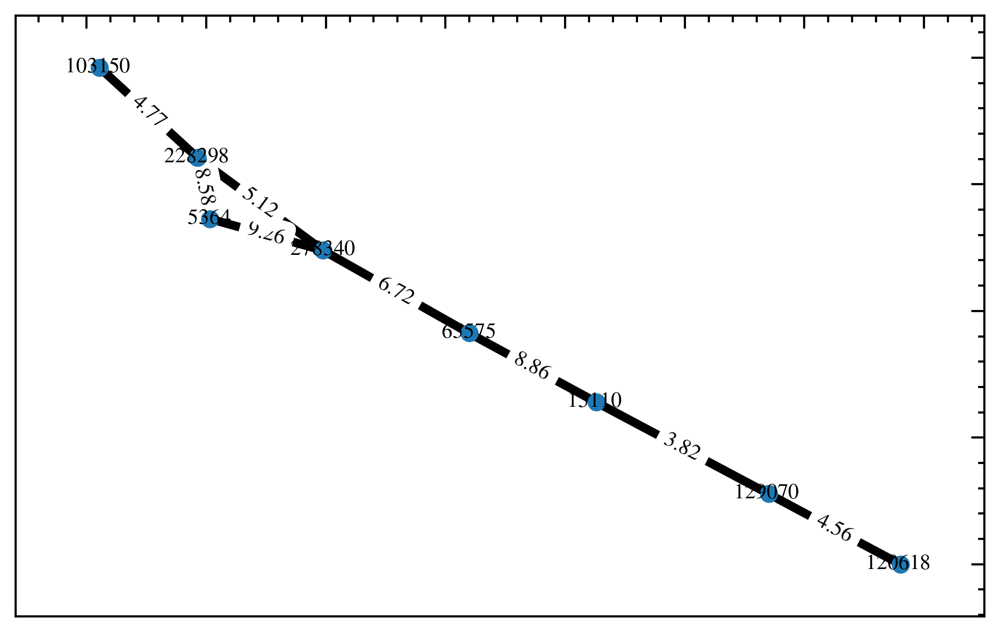

In [52]:
vehicle_id = 407

sb_graph = G.subgraph(cc[vehicle_id])
score = get_graph_score([cc[vehicle_id]])

# plot the small graph
plot_graph(vehicle_id, subgraph=sb_graph)

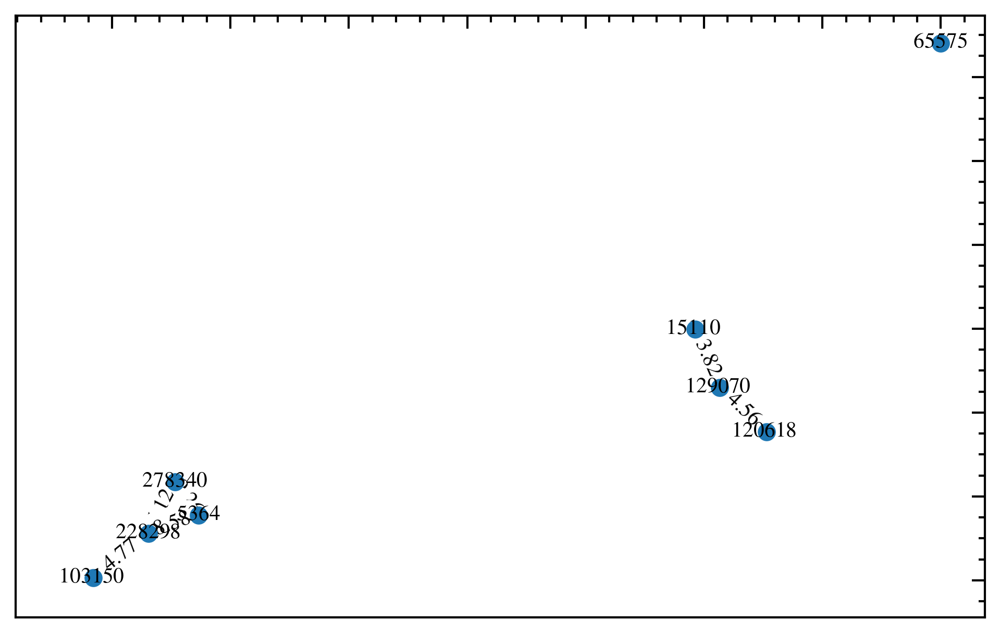

In [92]:
from src.pipelines.association import (
    walk_graph_removals
)

removals = walk_graph_removals(sb_graph.copy(), 2, get_graph_score_sub)

p_graph = G.subgraph(cc[vehicle_id]).copy()
for edge in removals:
    p_graph.remove_edge(*edge)
plot_graph(vehicle_id, subgraph=p_graph)

In [93]:
import plotly.graph_objects as go
from src.plotting.time_space import plot_time_space
from datetime import timedelta
from plotly.subplots import make_subplots

fig = go.Figure()

vehicle_id = 407

# 2023-03-12 21:42:21.100
cc_list = cc[vehicle_id]

# get a 10 minute window
plot_df = (
    joined_df
    .pipe(radar_obj.add_cst_timezone)
    .filter(
        pl.col("object_id").is_in(
            pl.Series(np.array(list(cc_list), dtype=np.int64), dtype=pl.Int64)
        )
    )
    .join(
        pl.DataFrame(
            [(i, v) for i, v_list in enumerate(list(nx.connected_components(p_graph))) for v in v_list],
            schema=['vehicle_id_new', 'object_id']
        ).with_columns(pl.col("object_id").cast(pl.UInt32)),
        on="object_id",
    )
)

fig = plot_time_space(
    plot_df,
    hoverdata="object_id",
    vehicle_col="vehicle_id_new",
    s_col="front_s",
    markers=True,
    fig=fig,
    # every=2,
)

fig.update_layout(yaxis_autorange="reversed")
# show the legend
fig.update_layout(showlegend=True)


fig.show()


function: add_cst_timezone took: 0.0009219646453857422 seconds


In [88]:
scores = []

def walk_removals(graph: nx.Graph, remove_connections: List[tuple]) -> List[tuple]:
    for remove in remove_connections:
        graph.remove_edge(*remove)
    return list(nx.connected_components(graph)
    
for row in slice_1.iter_rows():
    score = get_graph_score_sub(
        sb_graph.copy(),
        [
            (row[0], row[5]),
        ],
    )
    scores.append((np.mean([s for s in score if s is not None]), (row[0], row[5])))
    print(scores[-1], score)

drop_conn = min(scores, key=lambda x: x[0])[1]

print(drop_conn)
g = sb_graph.copy()
g.remove_edge(*drop_conn)
plot_graph(0, subgraph=g)

SyntaxError: '(' was never closed (114798767.py, line 7)

(15110, 65575)
[12.009355306625366, 4.190424919128418]


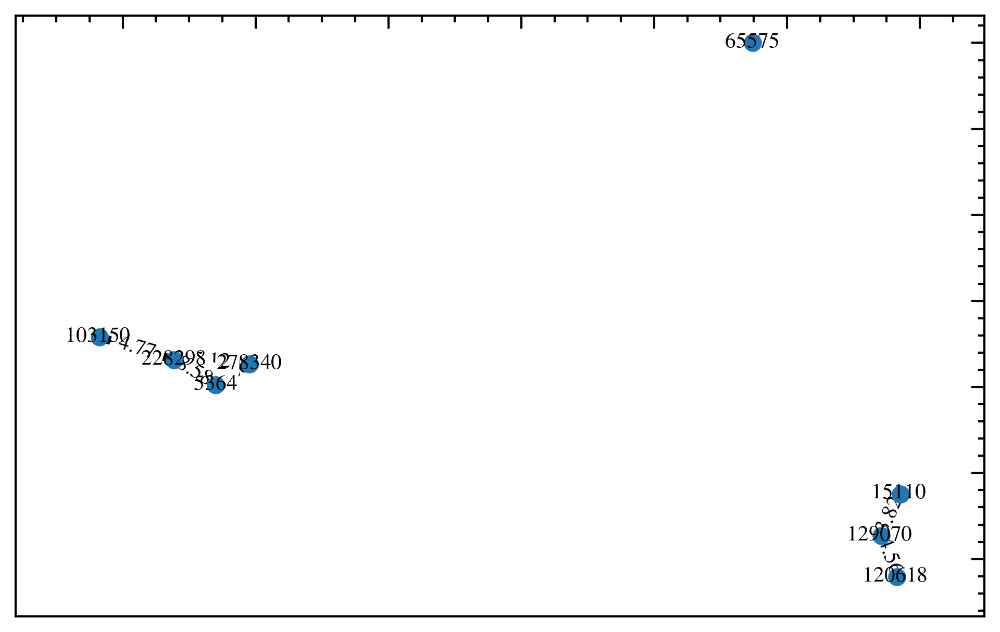

In [58]:
drop_conn = (15110, 65575)
print(drop_conn)
g = g.copy()
for drop
g.remove_edge(*drop_conn)
print(
    get_graph_score_sub(
        sb_graph.copy(),
        [
            drop_conn,
        ],
    )
)
plot_graph(0, subgraph=g)

In [59]:
list(nx.connected_components(g))

[{5364, 103150, 228298, 278340}, {15110, 120618, 129070}, {65575}]

In [62]:
import plotly.graph_objects as go
from src.plotting.time_space import plot_time_space
from datetime import timedelta
from plotly.subplots import make_subplots

fig = go.Figure()

vehicle_id = 407

# 2023-03-12 21:42:21.100
cc_list = cc[vehicle_id]

# get a 10 minute window
plot_df = (
    joined_df
    # .with_columns(pl.col("").alias("s"))
    .pipe(radar_obj.add_cst_timezone)
    # .sort("epoch_time_cst")
    .filter(
        pl.col("object_id").is_in(
            pl.Series(np.array(list(cc_list), dtype=np.int64), dtype=pl.Int64)
        )
    )
    # .with_columns(
    #     (pl.col("front_s").max() - pl.col("front_s")).alias("front_s"),
    # )
    # .filter(pl.col("vehicle_id") == 886)
)

fig = plot_time_space(
    plot_df,
    hoverdata="object_id",
    vehicle_col="lane_index",
    s_col="front_s",
    markers=True,
    fig=fig,
    # every=2,
)

fig.update_layout(yaxis_autorange="reversed")

# add a plot of the d
other_fig = plot_time_space(
    plot_df,
    hoverdata="object_id",
    vehicle_col="lane_index",
    s_col="d",
    markers=True,
    # fig=fig,
    # every=2,
)


fig.show()
other_fig.show()

function: add_cst_timezone took: 0.0005598068237304688 seconds


In [48]:
# ( assoc_df
#     # .with_columns(pl.col("").alias("s"))
#     .pipe(radar_obj.add_cst_timezone).sort('epoch_time_cst').filter(
#         pl.col("epoch_time_cst").is_between(
#             pl.lit("2023-03-13 11:48:54").str.strptime(
#                 pl.Datetime(time_unit="ns", time_zone="US/Central"),
#             ),
#             pl.lit("2023-03-13 11:50:00").str.strptime(
#                 pl.Datetime(time_unit="ns", time_zone="US/Central"),
#             ),
#         )
#         & (pl.col("lane").str.contains("E"))
#         & (pl.col("lane_index") == 0)
#         & (pl.col("prediction") )
#     ))

In [94]:
import plotly.graph_objects as go
from src.plotting.time_space import plot_time_space
from datetime import timedelta


fig = go.Figure()

# 2023-03-12 21:42:21.100

# get a 10 minute window
plot_df = (
    assoc_df
    # .with_columns(pl.col("").alias("s"))
    .pipe(radar_obj.add_cst_timezone)
    # .sort("epoch_time_cst")
    .filter(
        pl.col("epoch_time_cst").is_between(
            pl.lit("2023-03-12 16:42:54").str.strptime(
                pl.Datetime(time_unit="ns", time_zone="US/Central"),
            ),
            pl.lit("2023-03-12 16:49:00").str.strptime(
                pl.Datetime(time_unit="ns", time_zone="US/Central"),
            ),
        )
        & (pl.col("lane").str.contains("W"))
        & (pl.col("lane_index") == 0)
    )
    # .with_columns(
    #     (pl.col("front_s").max() - pl.col("front_s")).alias("front_s"),
    # )
    # .filter(pl.col("vehicle_id") == 886)
)

fig = plot_time_space(
    plot_df,
    hoverdata="object_id",
    vehicle_col="vehicle_id",
    s_col="s",
    markers=True,
    fig=fig,
    # every=2,
)

fig.update_layout(yaxis_autorange="reversed")


fig.show()

function: add_cst_timezone took: 0.00038313865661621094 seconds


In [50]:
# (
#     lf_df
#     .pipe(calculate_match_indexes, match_time_threshold=100)
#     .pipe(
#         pipe_gate_headway_calc, alpha=0.9
#     )
#     .collect()
# )

In [96]:
def build_intermediate() -> None:
    return (
        lf_df.pipe(calculate_match_indexes, match_time_threshold=100).pipe(
            pipe_gate_headway_calc, alpha=0.9
        )
        # .unnest("pair")
    )

In [97]:
# leader_id = 1343
# follower_id = 621


# keep_ids = assoc_df.filter(pl.col("vehicle_id").is_in([follower_id]))[
#     ["vehicle_id", "object_id"]
# ].unique()

# keep_follower_ids = keep_ids["object_id"].unique()
# keep_leader_ids = assoc_df.filter(pl.col("vehicle_id").is_in([leader_id]))[
#     "object_id"
# ].unique()

keep_follower_ids = [278340]
keep_leader_ids = [5364]


stats_df = (
    build_intermediate()
    .filter(
        (
            pl.col("pair").list.get(0).is_in(keep_follower_ids)
            & pl.col("pair").list.get(1).is_in(keep_leader_ids)
        )
        | (
            pl.col("pair").list.get(0).is_in(keep_leader_ids)
            & pl.col("pair").list.get(1).is_in(keep_follower_ids)
        )
    )
    .collect()
)

plot_df = lf_df.filter(
    pl.col("object_id").is_in(keep_follower_ids)
    & pl.col("leader").is_in(keep_leader_ids)
).with_columns(
    ((pl.col("s_leader") - pl.col("s")) / pl.col("s_velocity")).alias("headway")
)

# plot the association_distance and s using plotly
from plotly.subplots import make_subplots

fig = make_subplots(
    # two y axis
    specs=[[{"secondary_y": True}]]
)

fig.add_trace(
    go.Scatter(
        x=plot_df["epoch_time"],
        y=plot_df["association_distance"],
        mode="lines+markers",
        name="Association Distance",
        line=dict(color="blue"),
    ),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(
        x=plot_df["epoch_time"],
        y=plot_df["association_distance"].rolling_mean(10),
        mode="lines+markers",
        name="Association Distance - EWM",
        line=dict(color="purple"),
    ),
    secondary_y=False,
)


fig.add_trace(
    go.Scatter(
        x=plot_df["epoch_time"],
        y=plot_df["headway"],
        mode="lines+markers",
        name="headway",
        line=dict(color="yellow"),
    ),
    secondary_y=False,
)


fig.add_trace(
    go.Scatter(
        x=plot_df["epoch_time"],
        y=plot_df["front_s"],
        mode="lines+markers",
        name="s",
        line=dict(color="red"),
    ),
    secondary_y=True,
)

fig.add_trace(
    go.Scatter(
        x=plot_df["epoch_time"],
        y=plot_df["s_leader"],
        mode="lines+markers",
        name="s_leader",
        line=dict(color="green"),
    ),
    secondary_y=True,
)

function: lazy_func took: 0.0017316341400146484 seconds
function: lazy_func took: 0.0009126663208007812 seconds


In [141]:
stats_df

pair,association_distance_filt,join_time,epoch_time,epoch_time_max,prediction,prediction_leader,headway,leader_s,s
list[u32],f32,"datetime[ms, UTC]","datetime[ms, UTC]","datetime[ms, UTC]",bool,bool,f32,f32,f32


## Fuse & Smooth the Trajectories


In [ ]:
# assoc_df.filter(
#     pl.col('vehicle_id').is_in([518, ])
# ).with_columns(
#     pl.count().over('epoch_time').alias('count')
# ).filter(
#     (pl.col('count') > 1)
# ).sort(
#     ['epoch_time', 'ip']
# ).with_c

In [98]:
from src.pipelines.association import build_fusion_df

fusion_df = (
    assoc_df
    # .filter(
    #     pl.col('vehicle_id').is_in([518, 777])
    # )
    .pipe(build_fusion_df, prediction_length=prediction_length, max_vehicle_num=3)
    .collect(streaming=True)
    .pipe(
        radar_obj.add_cst_timezone,
        time_col="epoch_time",
    )
)
# fusion_df.head()

function: lazy_func took: 3.565788507461548 seconds
function: add_cst_timezone took: 0.0004458427429199219 seconds


In [ ]:
# fusion_df.group_by(["vehicle_id", "time_index"]).agg(
#     pl.col("back_s").diff(),
#     pl.col("front_s").diff(),
#     pl.col("s").diff(),
# ).explode(["back_s", "front_s", "s"]).filter(pl.col("back_s").is_not_null())

In [99]:
distance_adjuster = (
    fusion_df.group_by(
        [
            "vehicle_id",
            "time_index",
        ]
    )
    .agg(
        pl.col("distanceToFront_s")
        .filter(pl.col("approaching"))
        .mean()
        .alias("distanceToFront_s"),
        pl.col("distanceToBack_s")
        .filter(~pl.col("approaching"))
        .mean()
        .alias("distanceToBack_s"),
        pl.col("distanceToFront_s").mean().alias("distanceToFront_s_all"),
        pl.col("distanceToBack_s").mean().alias("distanceToBack_s_all"),
    )
    .with_columns(
        pl.when(pl.col("distanceToFront_s").is_null())
        .then(pl.col("distanceToFront_s_all"))
        .otherwise(pl.col("distanceToFront_s"))
        .alias("distanceToFront_s"),
        pl.when(pl.col("distanceToBack_s").is_null())
        .then(pl.col("distanceToBack_s_all"))
        .otherwise(pl.col("distanceToBack_s"))
        .alias("distanceToBack_s"),
    )
    .drop(["distanceToFront_s_all", "distanceToBack_s_all"])
)

In [100]:
outer_df = (
    fusion_df.select(
        [
            "front_s",
            "s",
            "back_s",
            "s_velocity",
            "d",
            "d_velocity",
            "P",
            "vehicle_id",
            "time_index",
            "vehicle_time_index_int",
            "prediction",
            "length_s",
        ]
    )
    .lazy()
    .filter(~pl.col("prediction"))
)

outer_df = (
    (
        outer_df.join(
            outer_df,
            on=["time_index", "vehicle_id"],
            how="outer",
            suffix="_leader",
        )
    )
    .with_columns(
        pl.struct(
            [
                pl.min_horizontal(
                    [
                        pl.col("vehicle_time_index_int"),
                        pl.col("vehicle_time_index_int_leader"),
                    ]
                ).alias("one"),
                pl.max_horizontal(
                    [
                        pl.col("vehicle_time_index_int"),
                        pl.col("vehicle_time_index_int_leader"),
                    ]
                ).alias("two"),
            ]
        ).alias("vehicle_time_struct"),
    )
    # .collect()
    .filter(
        (
            pl.col("vehicle_time_index_int")
            .cum_count()
            .over(["vehicle_id", "time_index", "vehicle_time_struct"])
            < 1
        )
        & (pl.col("vehicle_time_index_int") != pl.col("vehicle_time_index_int_leader"))
    )
    .collect(streaming=True)
    .pipe(
        calc_assoc_liklihood_distance,
        gpu=GPU,
        dims=2,
    )
    .group_by(["vehicle_id", "time_index"])
    .agg(pl.col("association_distance").max())
)

function: lazy_func took: 1.0136301517486572 seconds


In [101]:
prediction_tracker = (
    fusion_df.select(
        [
            "vehicle_id",
            "time_index",
            # "vehicle_time_index_int",
            "prediction",
        ]
    )
    .lazy()
    .group_by(["vehicle_id", "time_index"])
    .agg(pl.col("prediction").all().alias("prediction"))
    .collect()
)

In [102]:
# np.median(
#     fusion_df.filter(pl.col("P_CALC").arr.to_list().list.first().is_not_nan())["P_CALC"]
#     .to_numpy()
#     .reshape(-1, 6, 6),
#     axis=0,
# ).max()

In [ ]:
# fusion_df = (
#     fusion_df.lazy()
#     .join(
#         fusion_df.lazy()
#         .sort("epoch_time")
#         .filter(~pl.col('prediction'))
#         .group_by("vehicle_id")
#         .agg(pl.col("P_CALC").first().alias("last_P")),
#         on="vehicle_id",
#     )
#     .with_columns(pl.col(["last_P", "P_CALC"]).arr.to_list())
#     .with_columns(
#         pl.when(pl.col("prediction"))
#         .then(pl.col("last_P"))
#         .otherwise(pl.col("P_CALC"))
#         .alias("P_CALC")
#     )
#     .with_columns(pl.col("P_CALC").list.to_array(36))
#     .collect()
# )

In [103]:
from src.filters.fusion import batch_join, rts_smooth

GPU = True

# errrrrr

# v = fusion_df["P"].to_numpy(writable=True)
# v[:, 0] += fusion_df["length_s"].to_numpy() / 4

# fusion_df = fusion_df.with_columns(
#     P=v,
# ).with_columns(pl.col("P").list.to_array(width=36))

merged_df = batch_join(
    fusion_df,
    method="ImprovedFastCI",
    batch_size=10_000 if not GPU else 8_000,
    gpu=GPU,
    s_col="front_s",
)

100%|██████████| 1462/1462 [00:10<00:00, 133.75it/s]


In [104]:
merged_df = rts_smooth(
    merged_df, batch_size=10_000 if not GPU else 15_000, gpu=GPU, s_col="front_s"
)

/home/max/Development/roadside-radar/src/filters/fusion.py:1077: UserWarning:

The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:199.)

100%|██████████| 1462/1462 [00:03<00:00, 379.51it/s]


In [105]:
merged_df = (
    merged_df.lazy()
    .join(
        fusion_df.lazy()
        .select(["time_index", "vehicle_id", "object_id", "length_s"])
        .group_by(["time_index", "vehicle_id"])
        .agg(pl.col("object_id"), pl.col("length_s").mean()),
        on=["time_index", "vehicle_id"],
        how="left",
    )
    .join(
        outer_df.lazy().select(["time_index", "vehicle_id", "association_distance"]),
        on=["time_index", "vehicle_id"],
        how="left",
    )
    .join(
        distance_adjuster.lazy(),
        on=["vehicle_id", "time_index"],
        how="left",
    )
    .join(
        prediction_tracker.lazy(),
        on=["vehicle_id", "time_index"],
        how="left",
    )
    .with_columns(
        # (pl.col("ci_s") + pl.col("distanceToFront_s")).alias("ci_front_s"),
        # (pl.col("ci_s") + pl.col("distanceToBack_s")).alias("ci_back_s"),
        # (pl.col("s_smooth") + pl.col("distanceToFront_s")).alias("front_s_smooth"),
        # (pl.col("s_smooth") + pl.col("distanceToBack_s")).alias("back_s_smooth"),
        (pl.col("ci_front_s") - pl.col("length_s")).alias("ci_back_s"),
        (pl.col("ci_front_s") - pl.col("distanceToFront_s")).alias("ci_s"),
        (pl.col("front_s_smooth") - pl.col("length_s")).alias("back_s_smooth"),
        (pl.col("front_s_smooth") - pl.col("distanceToFront_s")).alias("s_smooth"),
    )
    .collect()
)

In [ ]:
# merged_df.filter(pl.col("vehicle_id") == veh).pipe(radar_obj.add_cst_timezone).head()

In [107]:
from src.plotting.single_veh import plot_vehicle

# 2370	22	2.326786	0.303536	"1"
# 1227	22	6.57618	1.667884	"1"
# 1209
vehs = [
    # 440
    # 4766,
    602,
    # 4791
    # 3845
    # 101,
    # 1098,
]

fig = None

for veh in vehs:
    ind_vehicles = (
        fusion_df.filter(pl.col("vehicle_id") == veh)["object_id"].unique().to_list()
    )

    fig = plot_vehicle(
        fusion_df.filter(pl.col("vehicle_id") == veh),
        s_velocity_col="s_velocity",
        s_col="front_s",
        fig=fig,
        data_name="IMM Filtered",
    )

    plot_vehicle(
        merged_df.filter(pl.col("vehicle_id") == veh).pipe(radar_obj.add_cst_timezone),
        # s_col="s_smooth",
        s_col="s_smooth",
        s_velocity_col="s_velocity_smooth",
        # s_velocity_col="ci_s_velocity",
        d_col="d_smooth",
        d_velocity_col="d_velocity_smooth",
        fig=fig,
        color="blue",
        data_name="Fused and Smoothed",
    )

    plot_vehicle(
        merged_df.filter(pl.col("vehicle_id") == veh).pipe(radar_obj.add_cst_timezone),
        # s_col="s_smooth",
        s_col="ci_s",
        s_velocity_col="ci_s_velocity",
        # s_velocity_col="ci_s_velocity",
        d_col="ci_d",
        d_velocity_col="ci_d_velocity",
        fig=fig,
        color="purple",
        data_name="CI Fused",
    )

    plot_vehicle(
        radar_df.filter(
            pl.col("object_id").is_in(
                assoc_df.filter(pl.col("vehicle_id") == veh)["object_id"]
            )
            & ~pl.col("prediction")
        ).pipe(
            radar_obj.add_cst_timezone,
        ),
        # s_col="front_s",
        # s_velocity_col="s_velocity",
        d_col="d",
        # d_velocity_col="d_velocity",
        fig=fig,
        color="black",
        data_name="Radar Raw",
    )

    # add a plot of the position differentiated
    _diff_df = (
        radar_df.filter(
            pl.col("object_id").is_in(
                assoc_df.filter(pl.col("vehicle_id") == veh)["object_id"]
            )
            & ~pl.col("prediction")
        )
        .pipe(
            radar_obj.add_cst_timezone,
        )
        .with_columns(
            (
                pl.col("s").diff()
                / (pl.col("epoch_time").diff().dt.total_milliseconds() / 1000)
            )
            .rolling_mean(center=True, window_size=50)
            .alias("diff_v")
        )
    )

    fig.add_trace(
        go.Scatter(
            x=_diff_df["epoch_time_cst"].cast(str),
            y=_diff_df["diff_v"],
            mode="lines",
            name="Radar Velocity",
            line=dict(color="black", width=2),
            yaxis="y2",
        )
    )


fig.update_layout(
    # use journal paper font
    font_family="Times New Roman",
    # set the font size
    font_size=22,
    # update the subplot titles
    title_font_family="Times New Roman",
    title_font_size=44,
    # set the x_limit
    yaxis=dict(
        title="S Distance [m]",
    ),
    yaxis2=dict(
        title="S Velocity [m/s]",
    ),
    yaxis3=dict(
        title="D Distance [m/s]",
    ),
    yaxis4=dict(
        title="D Velocity [m/s]",
    ),
    # set the size of the figure
    width=1000,
    height=600,
    template="ggplot2",
    # set the margin to reduce the whitespace
    margin=dict(l=0, r=0, t=0, b=0),
    # put the legend on the bottom
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1,
        font=dict(
            # family="Times New Roman",
            size=22,
        ),
    ),
)

function: add_cst_timezone took: 0.00020194053649902344 seconds
function: add_cst_timezone took: 0.0002548694610595703 seconds
function: add_cst_timezone took: 0.00027060508728027344 seconds
function: add_cst_timezone took: 0.00020599365234375 seconds


In [ ]:
import numpy as np
from scipy.signal import butter, sosfiltfilt
from scipy.integrate import cumtrapz


def butter_lowpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    sos = butter(order, normal_cutoff, btype="low", analog=False, output="sos")
    return sos


sos = butter_lowpass(0.25, 1 / 0.1, order=5)


def butter_lowpass_filter(data, cutoff, fs, order=5):
    # normalize data
    # max_val = np.max(data)
    # data = data / max_val
    # b, a = butter_lowpass(cutoff, fs, order=order)
    return sosfiltfilt(
        sos,
        data,
    )


fig = plot_vehicle(
    fusion_df.filter(pl.col("vehicle_id") == veh),
    s_velocity_col="s_velocity",
    s_col="s",
    # fig=fig,
    data_name="IMM Filtered",
    show_d=False,
)


# add a plot of the position differentiated
_diff_df = (
    radar_df.filter(
        pl.col("object_id").is_in(
            assoc_df.filter(pl.col("vehicle_id") == veh)["object_id"]
        )
        & ~pl.col("prediction")
    )
    .pipe(
        radar_obj.add_cst_timezone,
    )
    .sort("epoch_time")
    .with_columns(
        (
            (pl.col("utm_x").diff() ** 2 + pl.col("utm_y").diff() ** 2).sqrt()
            / (pl.col("epoch_time").diff().dt.total_milliseconds() / 1000)
        )
        .rolling_mean(center=True, window_size=10)
        .over("object_id")
        .alias("diff_v"),
        (
            pl.col("s").diff()
            / (pl.col("epoch_time").diff().dt.total_milliseconds() / 1000)
        )
        .rolling_mean(center=True, window_size=5)
        .over("object_id")
        .alias("diff_s_v"),
        (
            pl.col("s").diff()
            / (pl.col("epoch_time").diff().dt.total_milliseconds() / 1000)
        )
        .backward_fill(1)
        .map_elements(
            lambda x: pl.Series(
                values=butter_lowpass_filter(
                    x.to_numpy(), cutoff=0.25, fs=1 / 0.1, order=5
                ),
                name="diff_s_v_smooth",
            )
        )
        .over("object_id")
        .alias("diff_s_v_smooth"),
        (
            pl.col("s")
            .map_elements(
                lambda x: pl.Series(
                    values=butter_lowpass_filter(
                        x.to_numpy(), cutoff=0.25, fs=1 / 0.1, order=6
                    ),
                    # name="diff_s_v_smooth",
                )
            )
            .diff()
            / (pl.col("epoch_time").diff().dt.total_milliseconds() / 1000)
        )
        .over("object_id")
        .alias("diff_smooth_s_v"),
    )
    .with_columns(
        (
            pl.col("diff_s_v_smooth").map_elements(
                lambda x: pl.Series(
                    values=cumtrapz(x.to_numpy(), dx=0.1, initial=0),
                )
            )
            + pl.col("s").first()
        )
        .over("object_id")
        .alias("diff_s_v_smooth_int"),
    )
)


fig.add_trace(
    go.Scatter(
        x=_diff_df["epoch_time_cst"].cast(str),
        y=_diff_df["diff_v"],
        mode="lines",
        name="Radar Velocity",
        line=dict(color="black", width=2),
        yaxis="y2",
    )
)

fig.add_trace(
    go.Scatter(
        x=_diff_df["epoch_time_cst"].cast(str),
        y=_diff_df["diff_s_v"],
        mode="lines",
        name="Radar Velocity",
        line=dict(color="blue", width=2),
        yaxis="y2",
    )
)

fig.add_trace(
    go.Scatter(
        x=_diff_df["epoch_time_cst"].cast(str),
        y=_diff_df["diff_s_v_smooth"],
        mode="lines",
        name="Radar Velocity",
        line=dict(color="purple", width=2),
        yaxis="y2",
    )
)

fig.add_trace(
    go.Scatter(
        x=_diff_df["epoch_time_cst"].cast(str),
        y=_diff_df["diff_s_v_smooth_int"],
        mode="lines",
        name="Radar Velocity",
        line=dict(color="green", width=2),
        yaxis="y1",
    )
)

## Save the File

In [ ]:
from src.filters.vectorized_kalman import CALCFilter

print(CALCFilter.w_s)

In [ ]:
# add x/y as calculated by the Frenet Transform
transformations = [
    ("front_s_smooth", "d_smooth", "front_x_smooth", "front_y_smooth"),
    ("back_s_smooth", "d_smooth", "back_x_smooth", "back_y_smooth"),
    ("s_smooth", "d_smooth", "centroid_x_smooth", "centroid_y_smooth"),
    ("ci_front_s", "ci_d", "ci_front_x", "ci_front_y"),
    ("ci_back_s", "ci_d", "ci_back_x", "ci_back_y"),
    ("ci_s", "ci_d", "ci_centroid_x", "ci_centroid_y"),
]

for s_col, d_col, x_col, y_col in transformations:
    merged_df = (
        merged_df.pipe(
            mainline_net.frenet2xy,
            lane_col="lane",
            s_col=s_col,
            d_col=d_col,
        )
        .drop(["s", "angle"])
        .rename({"x_lane": x_col, "y_lane": y_col})
    )